![](https://raw.githubusercontent.com/jbottala02/CSC_126-2025/refs/heads/main/CSC-126%20GRAPHICS%20AND%20VISUAL%20COMPUTING.png)


# **Transformations - Translations and Rotations**

In this lesson we'll learn to:
1. Perform Image Translations
2. Rotations with getRotationMatrix2D
3. Rotations with Transpose
4. Flipping Images

In [ ]:
# Our Setup, Import Libaries, Create our Imshow Function and Download our Images
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Define our imshow function
def imshow(title = "Image", image = None, size = 10):
    if image is None:
        print("Please enter a valid image")
        return
    # The line below is changed from w, h to h, w
    w, h = image.shape[0], image.shape[1]
    aspect_ratio = w/h
    plt.figure(figsize=(size * aspect_ratio,size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()

# Download and unzip our images
!gdown --id 1qxuPaG5nqZF17Q2dZ6jmX516736yYoNv
!unzip -qq images.zip

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1qxuPaG5nqZF17Q2dZ6jmX516736yYoNv
From (redirected): https://drive.google.com/uc?id=1qxuPaG5nqZF17Q2dZ6jmX516736yYoNv&confirm=t&uuid=fdeb71a6-fb87-473a-8eb7-d9e846cbfbc6
To: /content/images.zip
100% 29.6M/29.6M [00:00<00:00, 114MB/s]


### **Translations**

This an affine transform that simply shifts the position of an image. (left or right).

We use cv2.warpAffine to implement these transformations.

```cv2.warpAffine(image, T, (width, height))```

![](https://raw.githubusercontent.com/jbottala02/CSC_126-2025/refs/heads/main/warp.png)

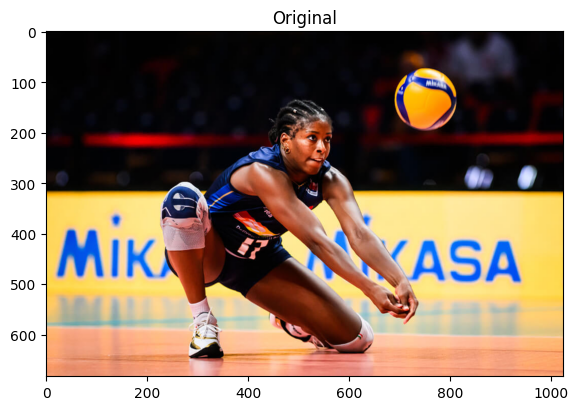

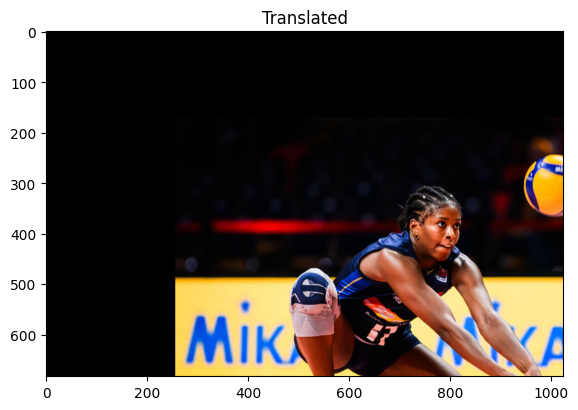

In [ ]:
# Load our image
image = cv2.imread('images/Volleyball.jpeg')
imshow("Original", image)

# Store height and width of the image
height, width = image.shape[:2]

# We shift it by quarter of the height and width
quarter_height, quarter_width = height/4, width/4

# Our Translation
#       | 1 0 Tx |
#  T  = | 0 1 Ty |

# T is our translation matrix
T = np.float32([[1, 0, quarter_width], [0, 1,quarter_height]])

# We use warpAffine to transform the image using the matrix, T
img_translation = cv2.warpAffine(image, T, (width, height))
imshow("Translated", img_translation)

In [ ]:
# What does T look like
print(T)

print(height, width )

[[  1.     0.   256.  ]
 [  0.     1.   170.75]]
683 1024


### **Rotations**

```cv2.getRotationMatrix2D(rotation_center_x, rotation_center_y, angle of rotation, scale)```

![](https://raw.githubusercontent.com/jbottala02/CSC_126-2025/refs/heads/main/rotation.png)


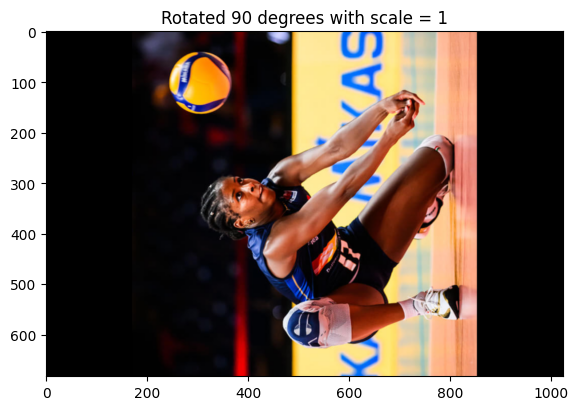

In [ ]:
# Load our image
image = cv2.imread('images/Volleyball.jpeg')
height, width = image.shape[:2]

# Divide by two to rototate the image around its centre
rotation_matrix = cv2.getRotationMatrix2D((width/2, height/2), 90, 1)

# Input our image, the rotation matrix and our desired final width and height
rotated_image = cv2.warpAffine(image, rotation_matrix, (width, height))
imshow("Rotated 90 degrees with scale = 1", rotated_image)

[[ 3.061617e-17  5.000000e-01  3.412500e+02]
 [-5.000000e-01  3.061617e-17  5.975000e+02]]


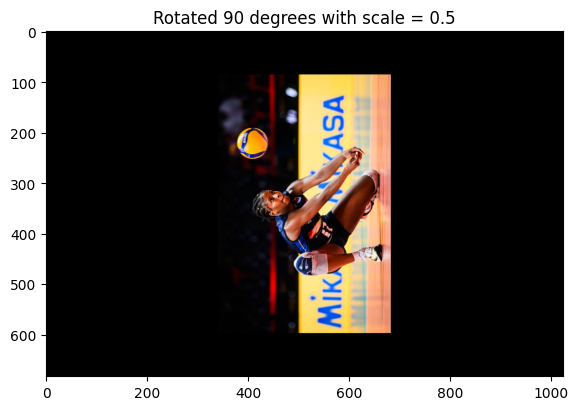

In [ ]:
# Divide by two to rototate the image around its centre
rotation_matrix = cv2.getRotationMatrix2D((width/2, height/2), 90, 0.5)
print(rotation_matrix)
# Input our image, the rotation matrix and our desired final width and height
rotated_image = cv2.warpAffine(image, rotation_matrix, (width, height))
imshow("Rotated 90 degrees with scale = 0.5", rotated_image)

Notice all the black space surrounding the image.

We could now crop the image as we can calculate it's new size (we haven't learned cropping yet!).

### **Rotations with cv2.transpose** (less flexible)




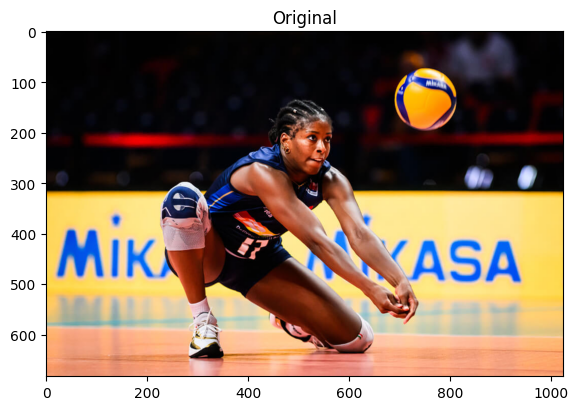

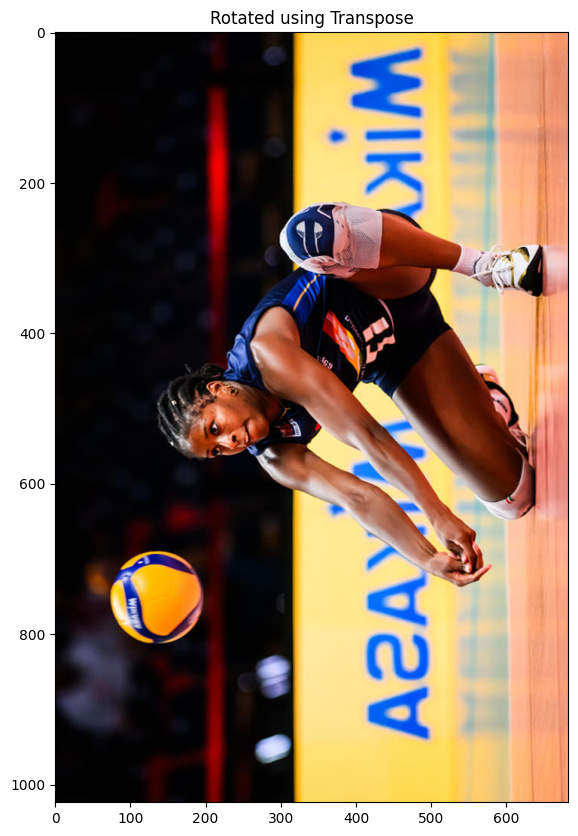

In [ ]:
rotated_image = cv2.transpose(image)
imshow("Original", image)
imshow("Rotated using Transpose", rotated_image)

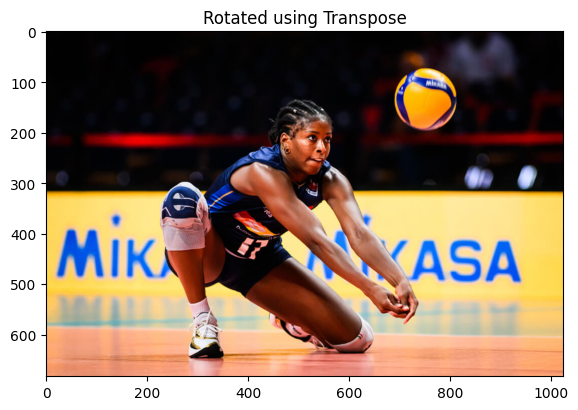

In [ ]:
rotated_image = cv2.transpose(image)
rotated_image = cv2.transpose(rotated_image)

imshow("Rotated using Transpose", rotated_image)

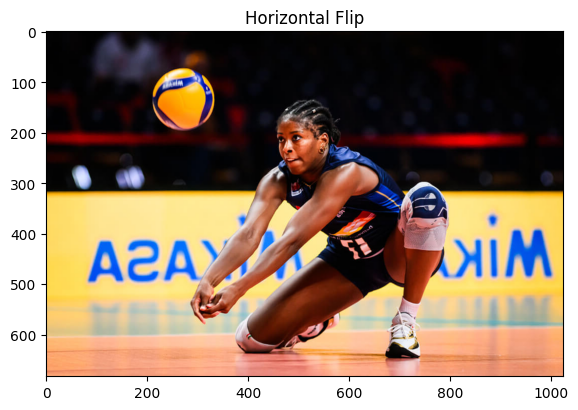

In [ ]:
# Let's now to a horizontal flip.
flipped = cv2.flip(image, 1)
imshow("Horizontal Flip", flipped)

# This is my tinkering

by **Kian Estrera**



In [ ]:
!gdown --id 1HZSJNjuz7A1qpUqca6Agr0II2Mr5JJp7

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1HZSJNjuz7A1qpUqca6Agr0II2Mr5JJp7
To: /content/mrbean.jpg
100% 102k/102k [00:00<00:00, 8.31MB/s]


In [ ]:
my_image_path = '/content/mrbean.jpg'
my_image = cv2.imread(my_image_path)

# Check if the image was loaded successfully
if my_image is not None:
  print("Image loaded successfully!")
else:
  print("Error loading image.")

Image loaded successfully!


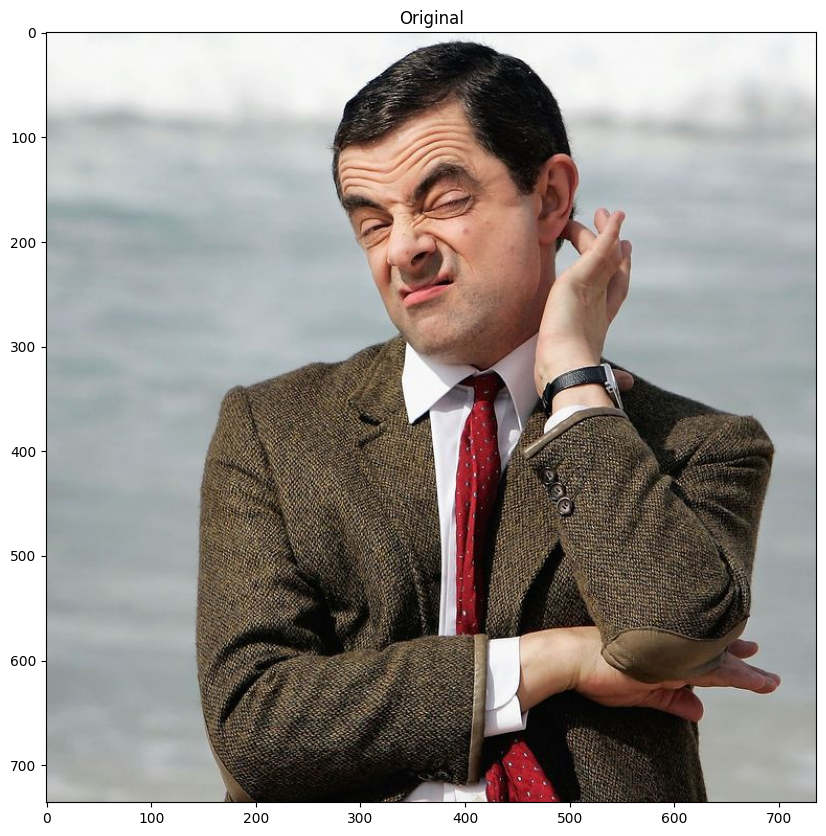

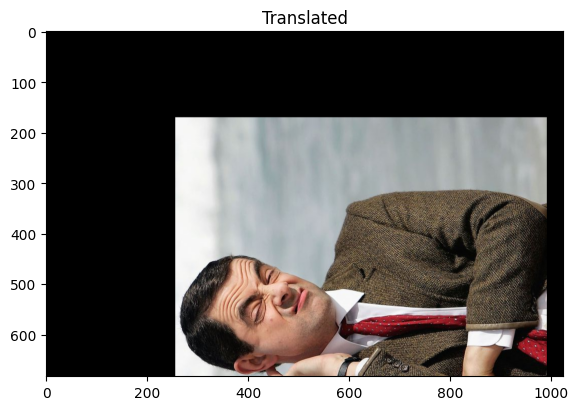

In [12]:

imshow("Original", my_image)

# Store height and width of the image
height, width = image.shape[:2]

# We shift it by quarter of the height and width
quarter_height, quarter_width = height/4, width/4

# Our Translation
#       | 1 0 Tx |
#  T  = | 0 1 Ty |

# T is our translation matrix
T = np.float32([[0, 1, quarter_width], [1, 0,quarter_height]])

# We use warpAffine to transform the image using the matrix, T
img_translation = cv2.warpAffine(my_image, T, (width, height))
imshow("Translated", img_translation)

In [13]:
# What does T look like
print(T)

print(height, width )

[[  0.     1.   256.  ]
 [  1.     0.   170.75]]
683 1024


In [14]:
image_path = '/content/mrbean.jpg'
image = cv2.imread(image_path)

# Check if the image was loaded successfully
if image is not None:
  print("Image loaded successfully!")
else:
  print("Error loading image.")

Image loaded successfully!


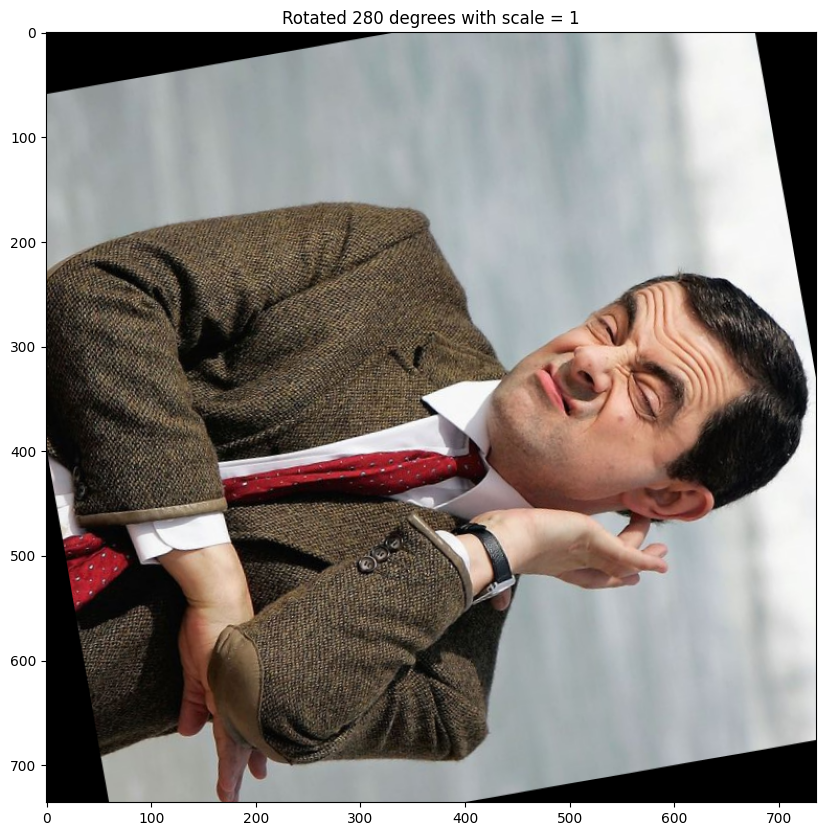

In [19]:

height, width = image.shape[:2]

# Divide by two to rototate the image around its centre
rotation_matrix = cv2.getRotationMatrix2D((width/2, height/2), 280, 1)

# Input our image, the rotation matrix and our desired final width and height
rotated_image = cv2.warpAffine(image, rotation_matrix, (width, height))
imshow("Rotated 280 degrees with scale = 1", rotated_image)

[[ 2.86788218e-01 -4.09576022e-01  4.13185912e+02]
 [ 4.09576022e-01  2.86788218e-01  1.11737960e+02]]


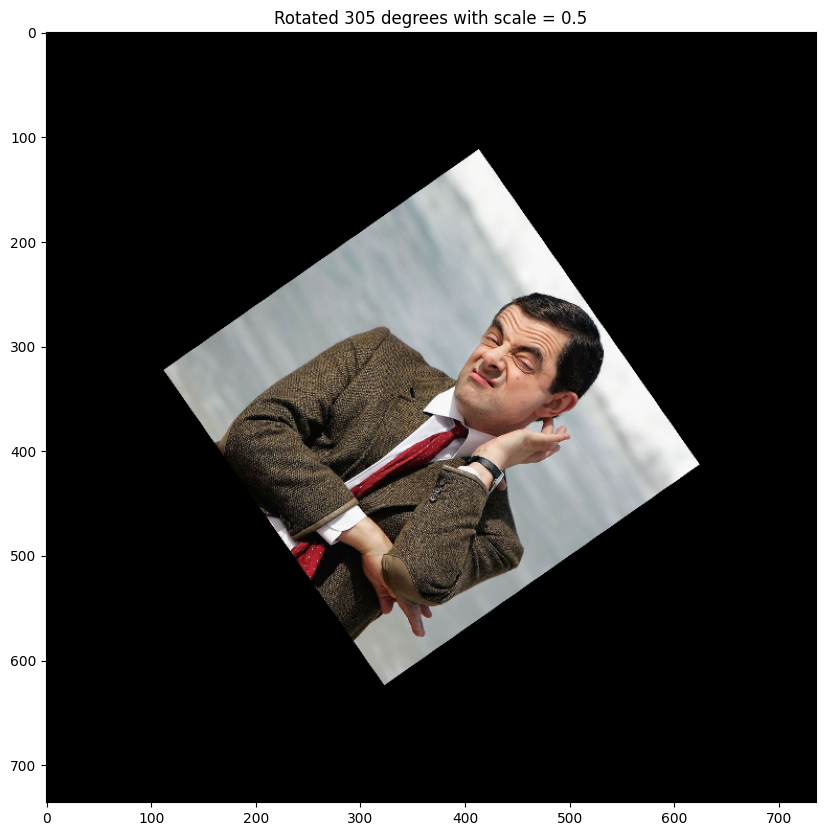

In [25]:
# Divide by two to rototate the image around its centre
rotation_matrix = cv2.getRotationMatrix2D((width/2, height/2), 305, 0.5)
print(rotation_matrix)
# Input our image, the rotation matrix and our desired final width and height
rotated_image = cv2.warpAffine(image, rotation_matrix, (width, height))
imshow("Rotated 305 degrees with scale = 0.5", rotated_image)

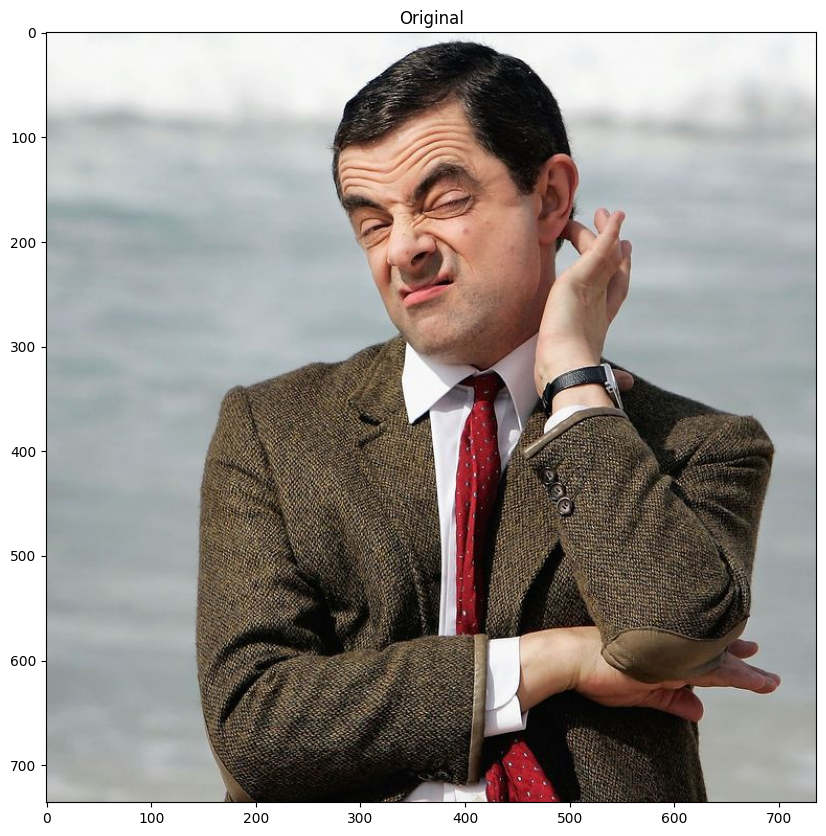

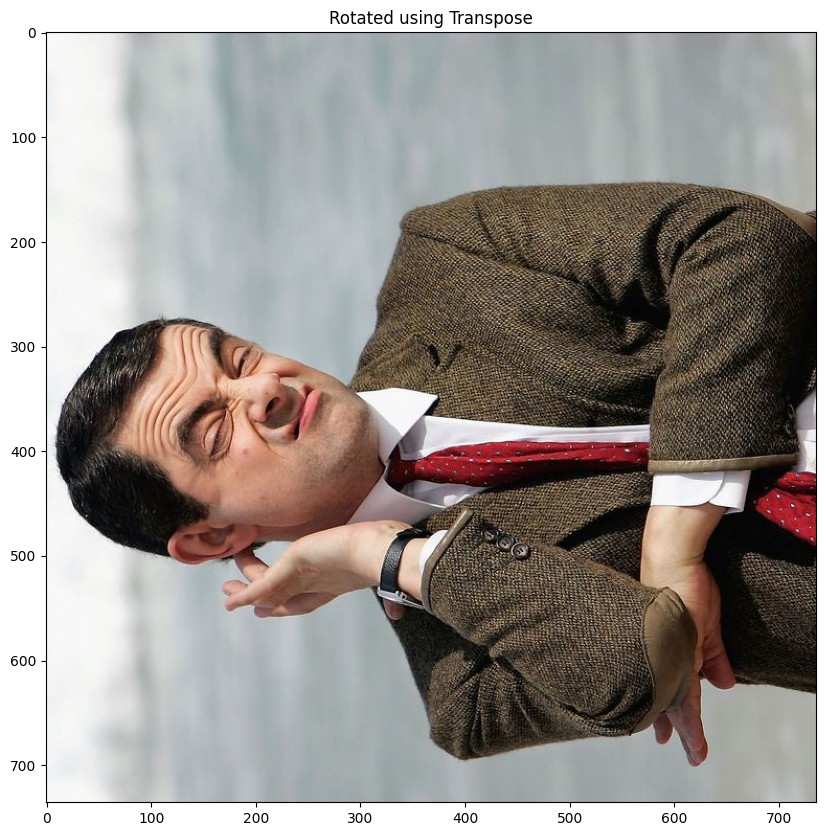

In [26]:
rotated_image = cv2.transpose(image)
imshow("Original", image)
imshow("Rotated using Transpose", rotated_image)

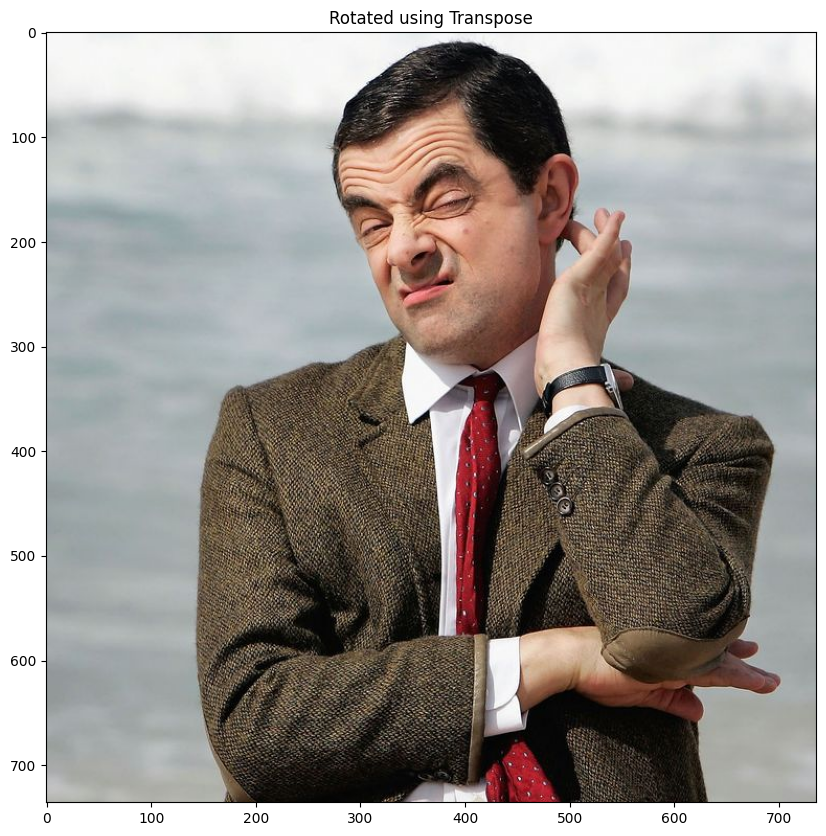

In [27]:
rotated_image = cv2.transpose(image)
rotated_image = cv2.transpose(rotated_image)

imshow("Rotated using Transpose", rotated_image)

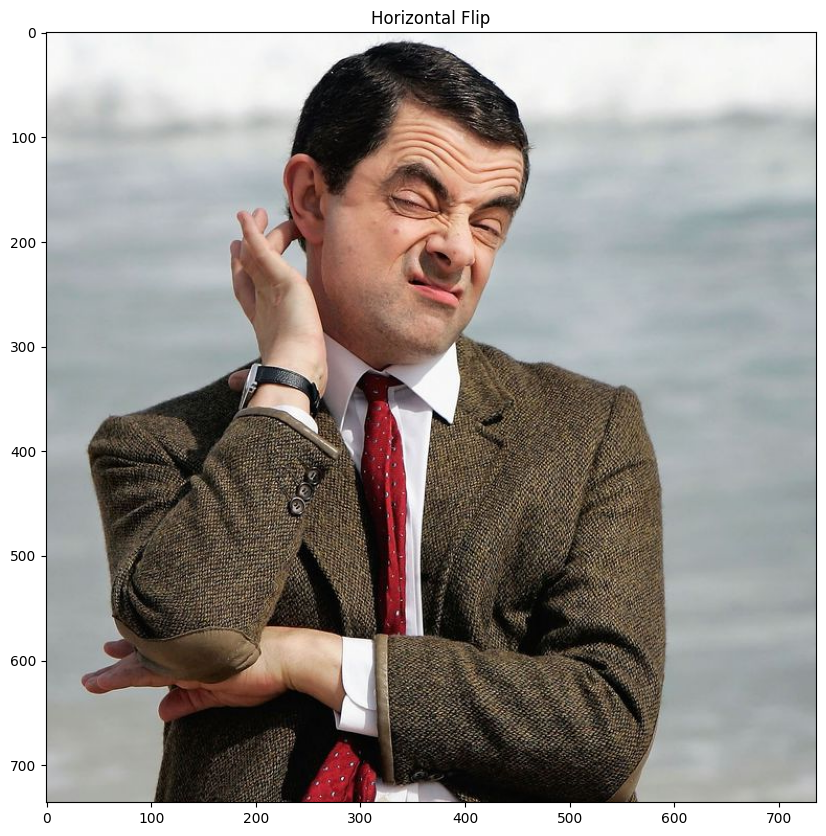

In [28]:
# Let's now to a horizontal flip.
flipped = cv2.flip(image, 1)
imshow("Horizontal Flip", flipped)